Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/

The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review

#### Objective:
Given a review, determine whether the review is positive (Rating of 4 or 5) or negative (rating of 1 or 2).


## Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score id above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [0]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

# importing Cross validation libs
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import model_selection

from matplotlib import pyplot
import seaborn as sns

import numpy

from sklearn.cluster import KMeans
from wordcloud import WordCloud

##Reading Data

In [2]:
# Code to read csv file into colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)



id = '1VDFn9tpwO0ecnr5DiC7TQwg-GVoPJUEK'

downloaded = drive.CreateFile({'id':id}) 
downloaded.GetContentFile('database.sqlite')  

# df2 = pd.read_csv(io.BytesIO(uploaded['Filename.csv']))

# using the SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 
#filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 50000""", con) 

# Give reviews with Score>3 a positive rating, and reviews with a score<3 a negative rating.
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (50000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [0]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [4]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [5]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [6]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


In [0]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [9]:
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(46072, 10)

In [10]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

92.144

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [0]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(46071, 10)


1    38479
0     7592
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [14]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

My dogs loves this chicken but its a product from China, so we wont be buying it anymore.  Its very hard to find any chicken products made in the USA but they are out there, but this one isnt.  Its too bad too because its a good product but I wont take any chances till they know what is going on with the china imports.
this is yummy, easy and unusual. it makes a quick, delicous pie, crisp or cobbler. home made is better, but a heck of a lot more work. this is great to have on hand for last minute dessert needs where you really want to impress wih your creativity in cooking! recommended.
Great flavor, low in calories, high in nutrients, high in protein! Usually protein powders are high priced and high in calories, this one is a great bargain and tastes great, I highly recommend for the lady gym rats, probably not "macho" enough for guys since it is soy based...
For those of you wanting a high-quality, yet affordable green tea, you should definitely give this one a try. Let me first star

In [15]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

My dogs loves this chicken but its a product from China, so we wont be buying it anymore.  Its very hard to find any chicken products made in the USA but they are out there, but this one isnt.  Its too bad too because its a good product but I wont take any chances till they know what is going on with the china imports.


In [16]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

My dogs loves this chicken but its a product from China, so we wont be buying it anymore.  Its very hard to find any chicken products made in the USA but they are out there, but this one isnt.  Its too bad too because its a good product but I wont take any chances till they know what is going on with the china imports.
this is yummy, easy and unusual. it makes a quick, delicous pie, crisp or cobbler. home made is better, but a heck of a lot more work. this is great to have on hand for last minute dessert needs where you really want to impress wih your creativity in cooking! recommended.
Great flavor, low in calories, high in nutrients, high in protein! Usually protein powders are high priced and high in calories, this one is a great bargain and tastes great, I highly recommend for the lady gym rats, probably not "macho" enough for guys since it is soy based...
For those of you wanting a high-quality, yet affordable green tea, you should definitely give this one a try. Let me first star

In [0]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [18]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

My dogs loves this chicken but its a product from China, so we wont be buying it anymore.  Its very hard to find any chicken products made in the USA but they are out there, but this one isnt.  Its too bad too because its a good product but I wont take any chances till they know what is going on with the china imports.


In [19]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

Great flavor low in calories high in nutrients high in protein Usually protein powders are high priced and high in calories this one is a great bargain and tastes great I highly recommend for the lady gym rats probably not macho enough for guys since it is soy based 


In [0]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [0]:
#filtered out whole reviews

from bs4 import BeautifulSoup
# Combining all the above stundents 
from tqdm import tqdm
# tqdm is for printing the status bar
word_counter = []
def filterised_text(text):
    preprocessed_text = []
    for sentance in tqdm(text):
        sentance = re.sub(r"http\S+", "", sentance)
        sentance = BeautifulSoup(sentance, 'lxml').get_text()
        sentance = decontracted(sentance)
        sentance = re.sub("\S*\d\S*", "", sentance).strip()
        sentance = re.sub('[^A-Za-z]+', ' ', sentance)
        # https://gist.github.com/sebleier/554280
        sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
        count = len(sentance.split())
        word_counter.append(count)
        preprocessed_text.append(sentance.strip())
    return preprocessed_text

In [22]:
preprocessed_reviews = filterised_text(final['Text'].values)
final['preprocessed_reviews']  = preprocessed_reviews
preprocessed_reviews[1822]

100%|██████████| 46071/46071 [00:20<00:00, 2278.94it/s]


'gobble one want dachsund mix horrible breath helps little definitely buy price right'

In [23]:
final['numbers_of_words']  = word_counter
word_counter[1822]

13

## [3.2] Preprocessing Review Summary

In [24]:
preprocessed_summary = filterised_text(final['Summary'].values)
final['preprocessed_summary']  = preprocessed_summary
preprocessed_summary[1822]

100%|██████████| 46071/46071 [00:14<00:00, 3255.17it/s]


'dog love'

Thoery behind Kmean can be found on below url
https://cs.wmich.edu/alfuqaha/summer14/cs6530/lectures/ClusteringAnalysis.pdf

In [0]:
K = [1, 2,3,4,5,6,7,8,9,10]

def finding_best_k(X_tr):

  train_ =[]
  
  for i in K:
      tr_kmeans = KMeans(n_clusters=i,verbose=1)
      tr_kmeans.fit(X_tr)

      train_inertia =  tr_kmeans.inertia_

      train_.append(train_inertia)
  return train_

def plotErrorplot(train_):
  plt.plot(K, train_, label='Train AUC')
  plt.legend()
  plt.xlabel("K: hyperparameter")
  plt.ylabel("Inertia")
  plt.grid()
  plt.title("ERROR PLOTS")
  plt.show()
  
  
# fetch result from dataframe, where matchlabel== expected label, finally convert to string
def returnWordCloudString(df, matchlabel):
    return df['Text'][df.label == matchlabel].to_string()
  
  
def plotWordCloud(text):

  #  https://www.geeksforgeeks.org/generating-word-cloud-python/

  wordcloud = WordCloud(width = 800, height = 800, 
                  background_color ='white', 
                  min_font_size = 10).generate(text) 

  # plot the WordCloud image                        
  plt.figure(figsize = (8, 8), facecolor = None) 
  plt.imshow(wordcloud) 
  plt.axis("off") 
  plt.tight_layout(pad = 0) 

  plt.show()

### Splitting data

In [0]:
X = final['preprocessed_reviews']
y = final['Score']

In [26]:
##BoW

count_vect = CountVectorizer(ngram_range=(1,2), min_df=10) #in scikit-learn

# train data
X = count_vect.fit_transform(X)

print('X_train_bow',X.shape)


X_train_bow (46071, 27311)


In [0]:
bow_train = finding_best_k(X)

Initialization complete
Iteration  0, inertia 4267341.000
Iteration  1, inertia 3161561.463
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.512675e-07
Initialization complete
Iteration  0, inertia 3908809.000
Iteration  1, inertia 3161561.463
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.512675e-07
Initialization complete
Iteration  0, inertia 4774775.000
Iteration  1, inertia 3161561.463
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.512675e-07
Initialization complete
Iteration  0, inertia 4044703.000
Iteration  1, inertia 3161561.463
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.512675e-07
Initialization complete
Iteration  0, inertia 4447350.000
Iteration  1, inertia 3161561.463
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.512675e-07
Initialization complete
Iteration  0, inertia 4332995.000
Iteration  1, inertia 3161561.463
Converged at iteration 1: center shift

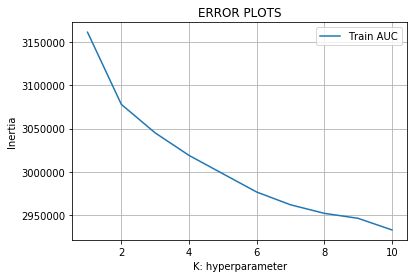

In [0]:
plotErrorplot(bow_train)

## Apply Kmean on BOW

In [0]:
kmeans = KMeans(n_clusters=2, n_jobs=-1).fit(X)

In [0]:
# https://pythonprogramminglanguage.com/kmeans-text-clustering/

print("Top terms per cluster:")
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
features_list = count_vect.get_feature_names()

cluster_1 = ' '
cluster_2 = ' '


for i in range(2):
    for index in order_centroids[i, :100]:
      if i==0:
        cluster_1 +=' ' +features_list[index]
      else :
        cluster_2 +=' ' +features_list[index]

cluster_1, cluster_2

Top terms per cluster:


numpy.ndarray

### Wordclouds of clusters obtained after applying Kmean on BOW

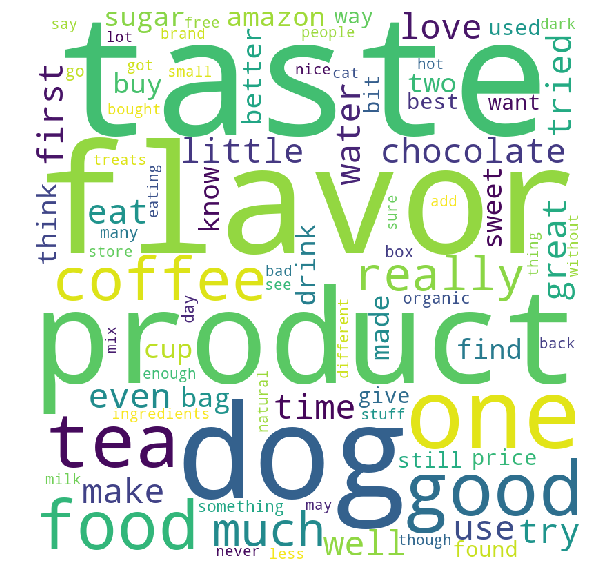

In [0]:
#  https://www.geeksforgeeks.org/generating-word-cloud-python/

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(cluster_1) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

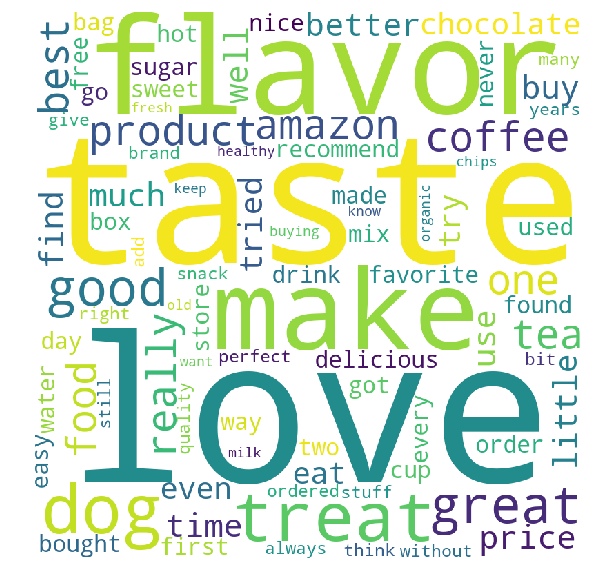

In [0]:
#  https://www.geeksforgeeks.org/generating-word-cloud-python/

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(cluster_2) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

### Observation

We have plot graph for finding best value and we can be observe that LOSS is following sharply upto 2 then so we will consider k=2. 

By Observing Word Cloud we can say that both cluster, have some similar words. So it is not good solutions. BOW Kmean is not effective in our case

# TFIDF

In [0]:
X = final['preprocessed_reviews']


tf_idf_vect = TfidfVectorizer(min_df=10) #in scikit-learn

# train data
X_tfidf = tf_idf_vect.fit_transform(X)

print('X_train_tfidf', X_tfidf.shape)


X_train_tfidf (46071, 8314)


In [0]:
tfidf_train = finding_best_k(X_tfidf)

Initialization complete
Iteration  0, inertia 91149.932
Iteration  1, inertia 44915.534
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.172624e-08
Initialization complete
Iteration  0, inertia 89920.085
Iteration  1, inertia 44915.534
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.172624e-08
Initialization complete
Iteration  0, inertia 89768.420
Iteration  1, inertia 44915.534
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.172624e-08
Initialization complete
Iteration  0, inertia 89067.022
Iteration  1, inertia 44915.534
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.172624e-08
Initialization complete
Iteration  0, inertia 88861.932
Iteration  1, inertia 44915.534
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.172624e-08
Initialization complete
Iteration  0, inertia 89523.011
Iteration  1, inertia 44915.534
Converged at iteration 1: center shift 0.000000e+00 within tol

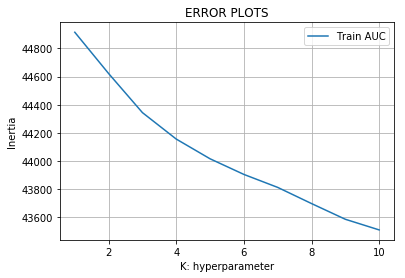

In [0]:
plotErrorplot(tfidf_train)

We can observe that upto k =3 loss it very steep.

## Apply KMean on TFIDF

In [0]:
tfidf_kmeans = KMeans(n_clusters=3, n_jobs=-1).fit(X_tfidf)

In [0]:
# https://pythonprogramminglanguage.com/kmeans-text-clustering/

print("Top terms per cluster:")
order_centroids = tfidf_kmeans.cluster_centers_.argsort()[:, ::-1]
features_list = count_vect.get_feature_names()

cluster_1 = ' '
cluster_2 = ' '
cluster_3 = ' '


for i in range(3):
    for index in order_centroids[i, :100]:
      if i==0:
        cluster_1 +=' ' +features_list[index]
      elif i==1:
        cluster_2 +=' ' +features_list[index]
      else :
        cluster_3 +=' ' +features_list[index]

cluster_list = [cluster_1, cluster_2,cluster_3]

Top terms per cluster:


('  corn wheat calories add coating ca definitely would coffee ever every store couple drops first months brushing brewers buy popcorn diagnosis bit hot assumption cookies would added plus also want deeply another batch constipated experience would blue mountain coffee almost favorite thing breakfast lunch family friends also well add tablespoon find one coffee mug bought several bit less fantastic flavor coffee fan amazon definitely burned false advertising bar influenster etc would best maple even using almost impossible cracked enough taste favorite things associated complex flavor coffee like bullet breathing diet great eat like find bulk every week amazon glad find difficult buying local day use caffeine carbonated beverages cats like dogs treats equipment blue diamond fashion brands coffee existence buy treats easily cookies good fallen love brian chocolate would cracked pepper cookie mix cups would alvita bought three bend coffee shops enough bought toy black pepper approaching 

### Wordclouds of clusters obtained after applying Kmean on TFIDF

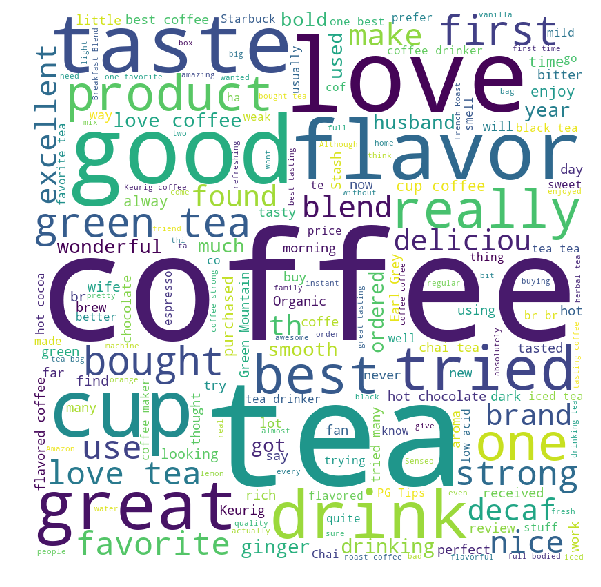

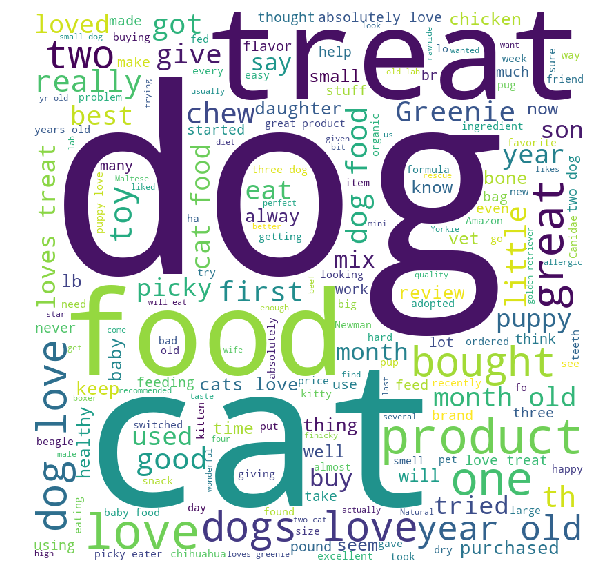

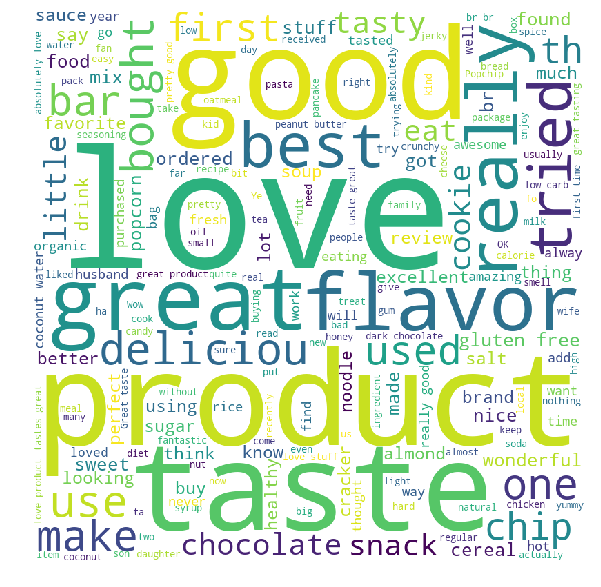

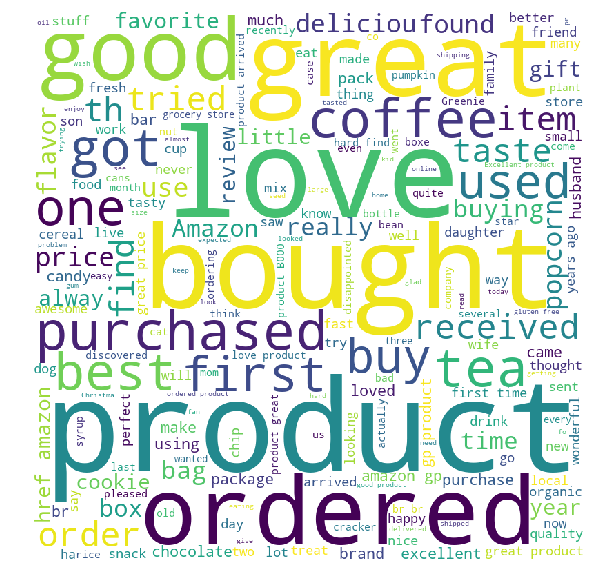

In [0]:
for i in cluster_list:
  plotWordCloud(i)

### Observation

We have plot graph for finding best value and we can be observe that LOSS is following sharply upto 3 then so we will consider k=3. 

By Observing Word Cloud, it is slighly better than BOW.

# [4.4] Word2Vec

In [0]:
X = final['preprocessed_reviews']

In [0]:
# Train your own Word2Vec model using your own text corpus

# Train data
list_of_sentance=[]
for sentance in X:
    list_of_sentance.append(sentance.split())


In [0]:
# Using Google News Word2Vectors

# in this project we are using a pretrained model by google
# its 3.3G file, once you load this into your memory 
# it occupies ~9Gb, so please do this step only if you have >12G of ram
# we will provide a pickle file wich contains a dict , 
# and it contains all our courpus words as keys and  model[word] as values
# To use this code-snippet, download "GoogleNews-vectors-negative300.bin" 
# from https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit
# it's 1.9GB in size.


# http://kavita-ganesan.com/gensim-word2vec-tutorial-starter-code/#.W17SRFAzZPY
# you can comment this whole cell
# or change these varible according to your need

is_your_ram_gt_16g=False
want_to_use_google_w2v = False
want_to_train_w2v = True

if want_to_train_w2v:
    # min_count = 5 considers only words that occured atleast 5 times
    # train data
    w2v_model_tr=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
    print(w2v_model_tr.wv.most_similar('great'))
    print('='*50)
    print(w2v_model_tr.wv.most_similar('worst'))
    
elif want_to_use_google_w2v and is_your_ram_gt_16g:
    if os.path.isfile('GoogleNews-vectors-negative300.bin'):
        w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
        print(w2v_model.wv.most_similar('great'))
        print(w2v_model.wv.most_similar('worst'))
    else:
        print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")

[('awesome', 0.828033447265625), ('fantastic', 0.813289225101471), ('terrific', 0.7942013740539551), ('good', 0.7934176921844482), ('excellent', 0.7845073938369751), ('wonderful', 0.7833070755004883), ('perfect', 0.7651985883712769), ('amazing', 0.749902069568634), ('decent', 0.7098312973976135), ('ideal', 0.6693737506866455)]
[('greatest', 0.7131052017211914), ('nastiest', 0.7087560296058655), ('best', 0.6991691589355469), ('awful', 0.6567899584770203), ('horrible', 0.6493061780929565), ('tastiest', 0.6473845839500427), ('experienced', 0.6350821852684021), ('eaten', 0.6341591477394104), ('disgusting', 0.6341456174850464), ('ive', 0.6277236938476562)]


In [0]:
# train data operation
w2v_train_words = list(w2v_model_tr.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_train_words))
print("sample words ", w2v_train_words[0:50])

number of words that occured minimum 5 times  12798
sample words  ['dogs', 'loves', 'chicken', 'product', 'china', 'wont', 'buying', 'anymore', 'hard', 'find', 'products', 'made', 'usa', 'one', 'isnt', 'bad', 'good', 'take', 'chances', 'till', 'know', 'going', 'imports', 'love', 'saw', 'pet', 'store', 'tag', 'attached', 'regarding', 'satisfied', 'safe', 'available', 'victor', 'traps', 'unreal', 'course', 'total', 'fly', 'pretty', 'stinky', 'right', 'nearby', 'used', 'bait', 'seasons', 'ca', 'not', 'beat', 'great']


In [0]:
# average Word2Vec

# train data operation
# compute average word2vec for each review.
final_w2v_train = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_train_words:
            vec = w2v_model_tr.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    final_w2v_train.append(sent_vec)
print(len(final_w2v_train))
print(len(final_w2v_train[0]))

100%|██████████| 46071/46071 [01:35<00:00, 480.87it/s]

46071
50


In [0]:
w2v_train = finding_best_k(final_w2v_train)

Initialization complete
Iteration  0, inertia 1157730.515
Iteration  1, inertia 328770.342
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.427233e-05
Initialization complete
Iteration  0, inertia 701986.357
Iteration  1, inertia 328770.342
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.427233e-05
Initialization complete
Iteration  0, inertia 573382.716
Iteration  1, inertia 328770.342
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.427233e-05
Initialization complete
Iteration  0, inertia 453189.744
Iteration  1, inertia 328770.342
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.427233e-05
Initialization complete
Iteration  0, inertia 609107.197
Iteration  1, inertia 328770.342
Converged at iteration 1: center shift 0.000000e+00 within tolerance 1.427233e-05
Initialization complete
Iteration  0, inertia 758160.246
Iteration  1, inertia 328770.342
Converged at iteration 1: center shift 0.000000e+

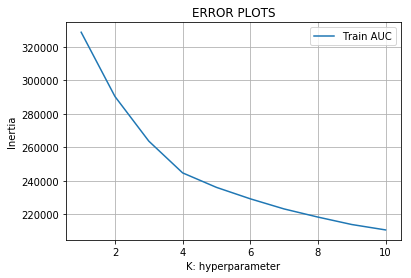

In [0]:
plotErrorplot(w2v_train)

We can see that there are two segments one graph is steep upto K =2 and K =4. These will we consider K=4

### Wordclouds of clusters obtained after applying Kmean on W2V

In [0]:
w2v_kmeans = KMeans(n_clusters=4, n_jobs=-1).fit(final_w2v_train)

In [0]:
labels = w2v_kmeans.labels_

# create duplicate copy of original dataframe as final4
final4 = final.copy()

# adding this labels result to duplicate copy dataframe
final4['label']= labels


# fetch reviews, those label==0, also convert to string
cluster_0 = returnWordCloudString(final4,0)

# fetch reviews, those label==1, also convert to string
cluster_1 = returnWordCloudString(final4,1)

# fetch reviews, those label==2, also convert to string
cluster_2 = returnWordCloudString(final4,2)

# fetch reviews, those label==3, also convert to string
cluster_3 = returnWordCloudString(final4,3)

cluster_list = (cluster_0, cluster_1,cluster_2,cluster_3)

cluster_0, cluster_1,cluster_2,cluster_3


('8695     Good flavor, unique in all the teas that I\'ve ...\n8694     If you\'re new to this product you need to be v...\n38888    This blend is one of Starbucks\' gentler blends...\n38889    The grocery store has all kinds of &quot;gourm...\n5631     I am hooked on it.  It\'s just wonderful.  High...\n5632     I normally hate, hate, hate citrus anything in...\n5630     My daughter loved the little tin that came wit...\n26027    It\'s pretty remarkable that I\'m writing a revi...\n47159    Adagio herbal teas are some of the highest qua...\n47157    This is a very tasty, high quality blend.  It ...\n47158    This tea is very delicious and flavorful.  The...\n38455    Hachez is by far my favorite chocolate.  The s...\n38460    the most flavorless dark chocolate I have ever...\n28828    I received this tea for Christmas.  This tea h...\n48547    I love- prefer- my coffee with chicory which a...\n48548    This chicory has a wonderful taste and i recom...\n24507    This tea is incredible!

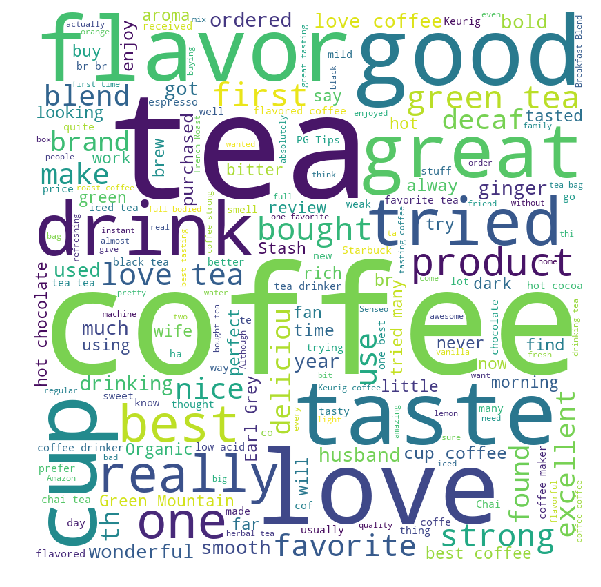

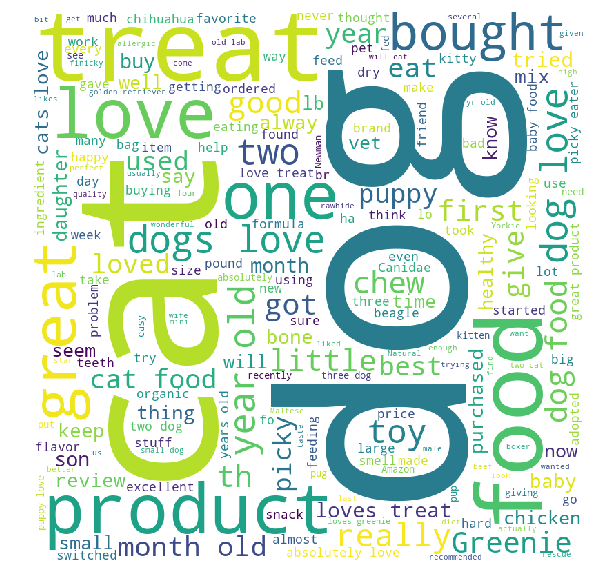

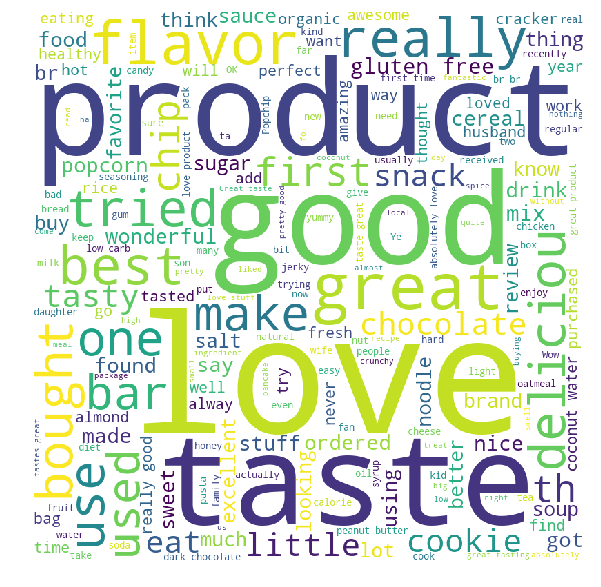

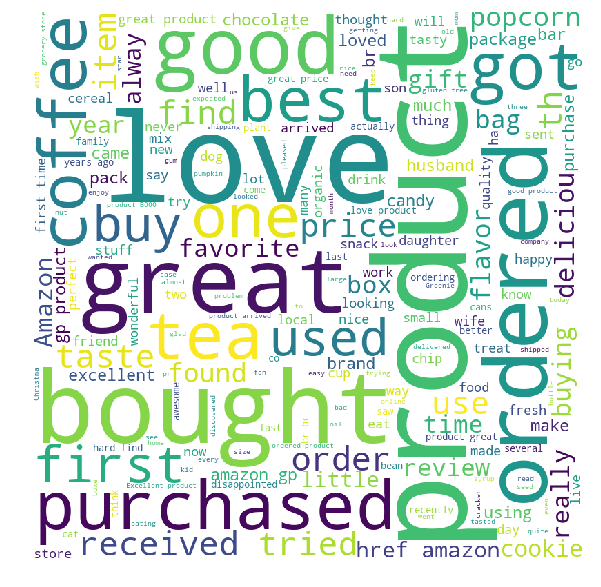

In [0]:
for i in cluster_list:
    plotWordCloud(i)

### Observation

We have plot graph for finding best value and we can be observe that LOSS is following sharply upto 3 then so we will consider k=3. 

Here we have perform small hack to retrieve each review, from each cluster, we have labelled the original dataframe as per predicted label then collect review depends on clusters. 

We can have better result,word Dog, Cat are placed in sinlge cluster as well, word Tea,coffee placed in same cluster and word purchased,received,tried,bought, used are placed in same cluster.

## [4.4.1.2] TFIDF weighted W2v

In [0]:
X = final['preprocessed_reviews']

In [0]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
model = TfidfVectorizer()
tf_idf_matrix = model.fit_transform(X)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

In [0]:
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tf_idf_vect.get_feature_names(), list(tf_idf_vect.idf_)))

# TF-IDF weighted Word2Vec

# Train data operation

# store model to hard disk if exist then load model directly from memory
tfidf_feat = tf_idf_vect.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

final_tfidf_w2v_tr = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_train_words and word in tfidf_feat:
            vec = w2v_model_tr.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    final_tfidf_w2v_tr.append(sent_vec)
    row += 1
    

100%|██████████| 46071/46071 [06:53<00:00, 111.44it/s]


In [0]:
tfidf_w2v_train = finding_best_k(final_tfidf_w2v_tr)

Initialization complete
Iteration  0, inertia 777342.552
Iteration  1, inertia 461963.904
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.005443e-05
Initialization complete
Iteration  0, inertia 761127.179
Iteration  1, inertia 461963.904
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.005443e-05
Initialization complete
Iteration  0, inertia 770841.456
Iteration  1, inertia 461963.904
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.005443e-05
Initialization complete
Iteration  0, inertia 2095195.056
Iteration  1, inertia 461963.904
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.005443e-05
Initialization complete
Iteration  0, inertia 731643.338
Iteration  1, inertia 461963.904
Converged at iteration 1: center shift 0.000000e+00 within tolerance 2.005443e-05
Initialization complete
Iteration  0, inertia 993358.577
Iteration  1, inertia 461963.904
Converged at iteration 1: center shift 0.000000e+

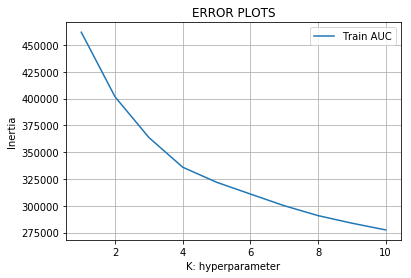

In [0]:
plotErrorplot(tfidf_w2v_train)

In [0]:
tfid_w2v_kmeans = KMeans(n_clusters=3, n_jobs=-1).fit(final_tfidf_w2v_tr)

labels = tfid_w2v_kmeans.labels_

# create duplicate copy of original dataframe as final4
final3 = final.copy()

# adding this labels result to duplicate copy dataframe
final3['label']= labels


# fetch reviews, those label==0, also convert to string
cluster_0 = returnWordCloudString(final3,0)

# fetch reviews, those label==1, also convert to string
cluster_1 = returnWordCloudString(final3,1)

# fetch reviews, those label==2, also convert to string
cluster_2 = returnWordCloudString(final3,2)


cluster_list = (cluster_0, cluster_1,cluster_2)

cluster_0, cluster_1,cluster_2


('8694     If you\'re new to this product you need to be v...\n5906     This is another favorite in our house.  My cat...\n24521    We\'ve used Swheat for at least 10 years, and h...\n17096    My dogs love the flavor of these.  I have trie...\n17071    Yes, I tasted them - they taste like chemicals...\n28085    A tennis player hubby of mine got this pack on...\n28087    I love this stuff. It is sugar-free so it does...\n29901    i used these as a decor on ginger bread.my kid...\n14381    This stuff is incredible...put it on pork chic...\n14380    This is a great pork seasoning. I first tried ...\n14352    When you think about paying $4.00 a 3 oz bottl...\n14349    This is my go-to seasoning blend now. I wish I...\n14350    I absolutely love this product!<br />As a home...\n14347    I\'ve been experimenting with Cajun food for qu...\n14348    We absolutely love this seasoning. I worked ye...\n14075    I haven\'t tried a bad seasoning flavor yet.  T...\n14074    This is the best seafood/

### Wordclouds of clusters obtained after applying Kmean on TFIDF-W2V

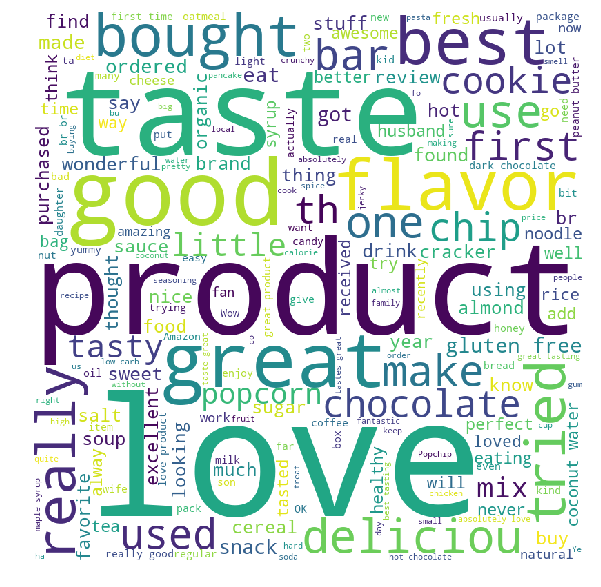

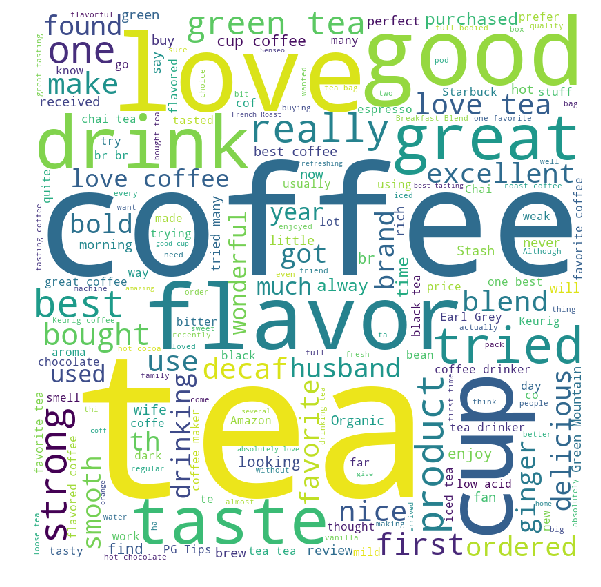

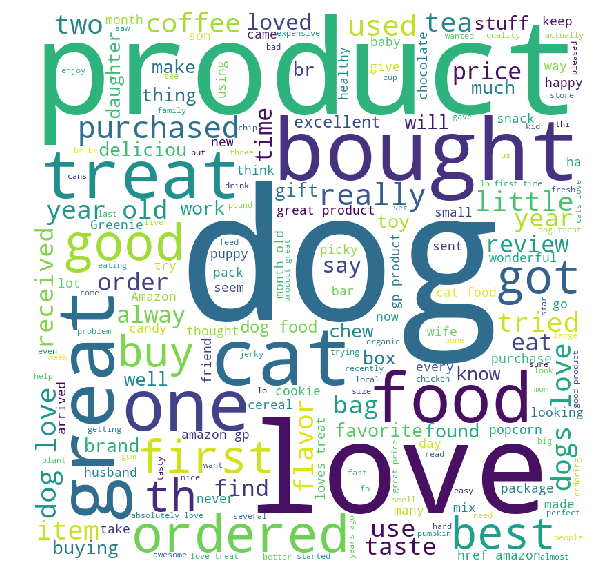

In [0]:
for i in cluster_list:
    plotWordCloud(i)

### Observation

We have plot graph for finding best value and we can be observe that LOSS is following sharply upto 3 then so we will consider k=3. 

Here we have perform same hack as per word2vec.

We can have better result

Green Tea, Tea, Coffee, Drink, Strong this word found in similar cluster
Dog,Cat are dound in same clusters
Good, best, delicious etc are in same cluster

# Conclusion

For all experiement we have consider **50000** datapoints.

In [0]:
from prettytable import PrettyTable
x = PrettyTable()
x.field_names = ["Models/param", "BOW","TFIDF","AvgW2V", "TFIDF-W-W2V"]

x.add_row(["No. of clusters  ","2","3","4","3" ])
x.add_row(["Top words: ","love, great,product, gluten free,chip,delicious", "product, dog,chip,coffee,love","love,purchased,great,delicious,good","tea,flavor,product,coffee" ])


print(x)

+-------------------+-------------------------------------------------+-------------------------------+-------------------------------------+---------------------------+
|    Models/param   |                       BOW                       |             TFIDF             |                AvgW2V               |        TFIDF-W-W2V        |
+-------------------+-------------------------------------------------+-------------------------------+-------------------------------------+---------------------------+
| No. of clusters   |                        2                        |               3               |                  4                  |             3             |
|    Top words:     | love, great,product, gluten free,chip,delicious | product, dog,chip,coffee,love | love,purchased,great,delicious,good | tea,flavor,product,coffee |
+-------------------+-------------------------------------------------+-------------------------------+-------------------------------------+---------

### Observation

We have consider 50,000 points. We can say that it is slighly better when we are using Avg w2v and TFIDF-W2V.  Yet we have not only consider WordCloud we are saying that W2V and TFIDF are slightly better.